# Zomato API - II

## Gathering data

Due to Zomato API Basic Plan restriction, we cannot collect enough data for analysis. To overcome this problem ‘Zomato.csv’ file is provided to analyse the data deeply and to get useful inference.
Data has been collected from the Zomato API in the form of .json files(raw data) using the following url ("https://developers.zomato.com/api/v2.1/search?entity_id=1&entity_type=city&start=1&count=20 ") and stored in CSV file.

### Importing libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df_orig=pd.read_csv('zomato.csv',encoding='ISO-8859-1')
df=df_orig.copy()

## Assessing data

In [58]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Online delivery,Price range,Aggregate rating,Rating text,Votes
0,3400025,Jahanpanah,1,rest,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),No,3,3.9,Good,140
1,3400341,Rangrezz Restaurant,1,rest,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),No,2,3.5,Good,71
2,3400005,Time2Eat - Mama Chicken,1,rest,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),No,2,3.6,Good,94
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,rest,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),No,2,4.0,Very Good,87
4,3400017,Pinch Of Spice,1,rest,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),No,3,4.2,Very Good,177


In [59]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Online delivery,Price range,Aggregate rating,Rating text,Votes
0,3400025,Jahanpanah,1,rest,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),No,3,3.9,Good,140
1,3400341,Rangrezz Restaurant,1,rest,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),No,2,3.5,Good,71
2,3400005,Time2Eat - Mama Chicken,1,rest,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),No,2,3.6,Good,94
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,rest,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),No,2,4.0,Very Good,87
4,3400017,Pinch Of Spice,1,rest,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),No,3,4.2,Very Good,177
5,3400325,MoMo Cafe,1,rest,"Courtyard by Marriott Agra, Phase 2, Fatehabad...","Courtyard by Marriott Agra, Tajganj","Courtyard by Marriott Agra, Tajganj, Agra",0.000000,0.000000,"North Indian, European",2000,Indian Rupees(Rs.),No,4,4.0,Very Good,45
6,3400059,Peshawri - ITC Mughal,1,rest,"ITC Mughal, Fatehabad Road, Tajganj, Agra","ITC Mughal, Tajganj","ITC Mughal, Tajganj, Agra",78.044095,27.160934,"North Indian, Mughlai",2500,Indian Rupees(Rs.),No,4,4.3,Very Good,133
7,3400060,Taj Bano - ITC Mughal,1,rest,"ITC Mughal, Fatehabad Road, Tajganj, Agra","ITC Mughal, Tajganj","ITC Mughal, Tajganj, Agra",78.044095,27.160934,Mughlai,2500,Indian Rupees(Rs.),No,4,4.0,Very Good,41
8,3400348,G Thal,1,rest,"3/20, KPS Tower, Near Tulsi Talkies, Bypass Ro...",Khandari,"Khandari, Agra",0.000000,0.000000,"Rajasthani, Gujarati, Mughlai",800,Indian Rupees(Rs.),No,3,3.6,Good,59
9,3400072,Dawat-e-Nawab - Radisson Blu,1,rest,"Radisson Blu, Taj East Gate Road, Tajganj, Agra","Radisson Blu, Tajganj","Radisson Blu, Tajganj, Agra",78.057044,27.163303,"North Indian, Mughlai",3600,Indian Rupees(Rs.),No,4,3.8,Good,46


In [57]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8652 entries, 0 to 8651
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         8652 non-null   int64  
 1   Restaurant Name       8652 non-null   object 
 2   Country Code          8652 non-null   int64  
 3   City                  8652 non-null   object 
 4   Address               8652 non-null   object 
 5   Locality              8652 non-null   object 
 6   Locality Verbose      8652 non-null   object 
 7   Longitude             8652 non-null   float64
 8   Latitude              8652 non-null   float64
 9   Cuisines              8652 non-null   object 
 10  Average Cost for two  8652 non-null   int64  
 11  Currency              8652 non-null   object 
 12  Has Online delivery   8652 non-null   object 
 13  Price range           8652 non-null   int64  
 14  Aggregate rating      8652 non-null   float64
 15  Rating text          

In [4]:
df.shape

(9551, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

#### Checking for null values

In [6]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [7]:
df.City.unique()

array(['Makati City', 'Mandaluyong City', 'Pasay City', 'Pasig City',
       'Quezon City', 'San Juan City', 'Santa Rosa', 'Tagaytay City',
       'Taguig City', 'Brasí_lia', 'Rio de Janeiro', 'Sí£o Paulo',
       'Albany', 'Armidale', 'Athens', 'Augusta', 'Balingup',
       'Beechworth', 'Boise', 'Cedar Rapids/Iowa City', 'Chatham-Kent',
       'Clatskanie', 'Cochrane', 'Columbus', 'Consort', 'Dalton',
       'Davenport', 'Des Moines', 'Dicky Beach', 'Dubuque',
       'East Ballina', 'Fernley', 'Flaxton', 'Forrest', 'Gainesville',
       'Hepburn Springs', 'Huskisson', 'Inverloch', 'Lakes Entrance',
       'Lakeview', 'Lincoln', 'Lorn', 'Macedon', 'Macon', 'Mayfield',
       'Mc Millan', 'Middleton Beach', 'Miller', 'Monroe', 'Montville',
       'Ojo Caliente', 'Orlando', 'Palm Cove', 'Paynesville', 'Penola',
       'Pensacola', 'Phillip Island', 'Pocatello', 'Potrero', 'Princeton',
       'Rest of Hawaii', 'Savannah', 'Singapore', 'Sioux City',
       'Tampa Bay', 'Tanunda', 'Trentha

## Cleaning Data:

In [8]:
df.drop(['Has Table booking','Is delivering now','Switch to order menu','Rating color'], axis = 1, inplace = True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Online delivery   9551 non-null   object 
 13  Price range           9551 non-null   int64  
 14  Aggregate rating      9551 non-null   float64
 15  Rating text          

In [10]:
df = df[df['Country Code'] == 1]
df.reset_index(drop = True, inplace = True)

In [11]:
df['City'].replace('New Delhi', 'ncr', inplace = True)
df['City'].replace('Ghaziabad', 'ncr', inplace = True)
df['City'].replace('Noida', 'ncr', inplace = True)
df['City'].replace('Gurgaon', 'ncr', inplace = True)
df['City'].replace('Faridabad', 'ncr', inplace = True)

# all other cities as Rest of India
indexes = df[df['City'] != 'ncr'].index

df.loc[indexes, 'City'] = 'rest'


## Data analysis and Visualisation

### No. of restraunts in Delhi NCR vs rest of India

In [12]:
region=df.City.value_counts().index
val=df.City.value_counts().values
print("No. of restraunts in Delhi Ncr :", val[0])
print("No. of restraunts in other cities :", val[1])


No. of restraunts in Delhi Ncr : 7947
No. of restraunts in other cities : 705


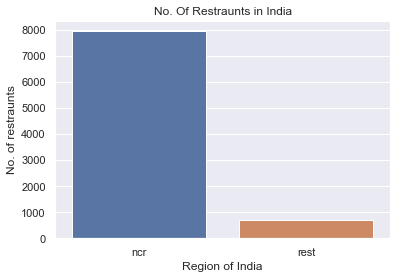

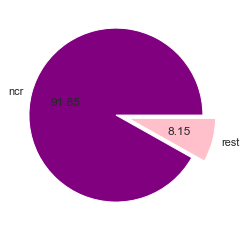

In [13]:
sns.set()
sns.barplot(x=region,y=val,)
plt.ylabel("No. of restraunts")
plt.xlabel("Region of India")
plt.title("No. Of Restraunts in India")
plt.show()

colors=["purple","pink"]
plt.pie(val,labels = region,explode=[0,0.15],colors=colors,autopct = "%.2f")
plt.show()

### Find the cuisines which are not present in restaurant of Delhi NCR but present in rest of India.Check using Zomato API whether this cuisines are actually not served in restaurants of Delhi-NCR or just it due to incomplete dataset.


In [14]:
delhi = []
others=[]
for i in range(len(df['City'])):
    if df['City'][i] =='ncr':
        if ',' in df['Cuisines'][i]:
            cu = df['Cuisines'][i].split(',')
            for j in cu:
                delhi.append(j.strip())
        else:
            delhi.append(df['Cuisines'][i])
    else:
        if ',' in df['Cuisines'][i]:
            cu = df['Cuisines'][i].split(',')
            for j in cu:
                others.append(j.strip())
        else:
            others.append(df['Cuisines'][i])
del_set=set(delhi)
oth_set=set(others)
only=oth_set-del_set
print(only)

{'Cajun', 'German', 'Malwani', 'BBQ'}


In [15]:
import requests
import json

h = {"user-key":"cf1194b048c4e62fcccfc0f02638d919"}
li=['New Delhi', 'Ghaziabad', 'Noida', 'Gurgaon', 'Faridabad']
cit=set()

for i in li:
    p = {'query':i}
    r=requests.get("https://developers.zomato.com/api/v2.1/locations",params=p,headers=h)
    data=r.json()
#     x=data["location_sugegstions"]
#     cit.append(x["city_id"])
    x=data['location_suggestions']
    for j in x:
        cit.add(j['city_id'])


In [16]:
import requests
import json

cui=set()
h = {"user-key":"cf1194b048c4e62fcccfc0f02638d919"}
p={'city_id':1}
r=requests.get("https://developers.zomato.com/api/v2.1/cuisines",params=p,headers=h)
data=r.json()
for i in data['cuisines']:
    cui.add(i['cuisine']['cuisine_name'])
    
li2=['Cajun', 'German', 'BBQ', 'Malwani']
for i in only:
    if i in cui:
        print(i)

Malwani
BBQ


### Find the top 10 cuisines served by maximum number of restaurants in Delhi NCR and rest of India.

In [17]:
d={}
for i in delhi:
        d[i]=d.get(i,0)+1
o={}
for i in others:
        o[i]=o.get(i,0)+1
        
sort_d = sorted(d.items(), key = lambda kv:kv[1], reverse = True)[:10]
sort_o = sorted(o.items(), key = lambda kv:kv[1], reverse = True)[:10]


In [18]:
print('Top 10 cuisines served by maximum number of restaurants in Delhi NCR are: ')
for i,j in sort_d:
    print(i," : ",j)
print("-----")        
print('Top 10 cuisines served by maximum number of restaurants in Rest of India are:')
for i,j in sort_o:

    print(i," : ",j)

Top 10 cuisines served by maximum number of restaurants in Delhi NCR are: 
North Indian  :  3597
Chinese  :  2448
Fast Food  :  1866
Mughlai  :  933
Bakery  :  697
South Indian  :  569
Continental  :  547
Desserts  :  542
Street Food  :  538
Italian  :  535
-----
Top 10 cuisines served by maximum number of restaurants in Rest of India are:
North Indian  :  349
Chinese  :  242
Continental  :  177
Italian  :  147
Cafe  :  136
Fast Food  :  97
South Indian  :  62
Mughlai  :  59
Desserts  :  55
Mexican  :  50


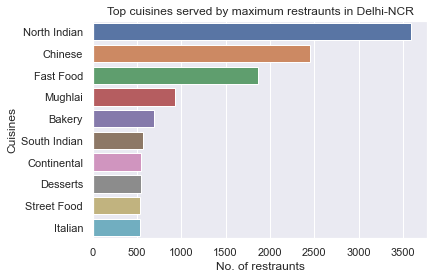

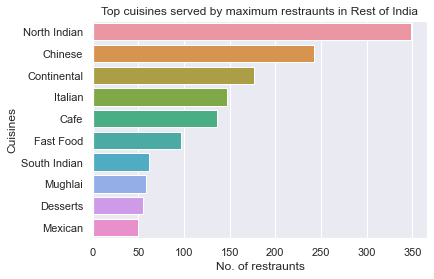

In [62]:
cui_d=[]
val_d=[]

cui_r=[]
val_r=[]

for i,j in sort_d:
    cui_d.append(i)
    val_d.append(j)
    
for l,m in sort_o:
    cui_r.append(l)
    val_r.append(m)
    
sns.set()
sns.barplot(x=val_d,y=cui_d)
plt.ylabel("Cuisines")
plt.xlabel("No. of restraunts")
plt.title("Top cuisines served by maximum restraunts in Delhi-NCR")
plt.show()

print()

sns.set()
sns.set_palette("RdPu")
sns.barplot(x=val_r,y=cui_r)
plt.ylabel("Cuisines")
plt.xlabel("No. of restraunts")
plt.title("Top cuisines served by maximum restraunts in Rest of India")
plt.show()

### Q4) Detailed analysis of how cuisine served is different from Delhi NCR to Rest of India.

### User Rating of a restaurant plays a crucial role in selecting a restaurant or ordering the food from the restaurant:

In [54]:
df[["Votes","Aggregate rating",]].corr()

,Votes,Aggregate rating
Votes,1.000000,0.287692
Aggregate rating,0.287692,1.000000


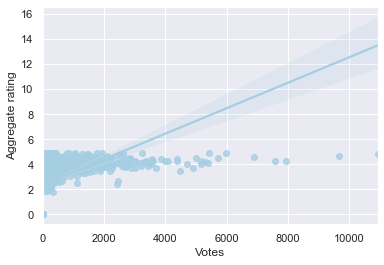

In [52]:
sns.regplot(data =df, x = 'Votes', y ='Aggregate rating')


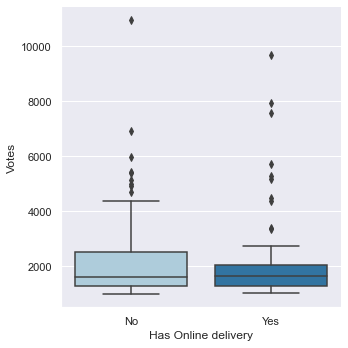

In [50]:
sns.catplot(x="Has Online delivery",y='Votes',data=high_votes,kind='box')
plt.show()

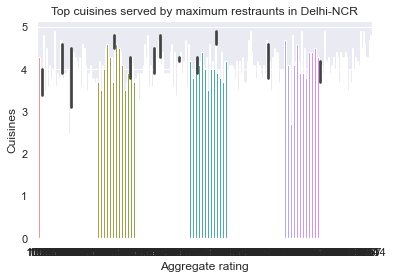

In [51]:
sns.set()
sns.set_palette("Paired")
sns.barplot(x=high_votes["Votes"],y=high_votes['Aggregate rating'])
plt.ylabel("Cuisines")
plt.xlabel("Aggregate rating")
plt.title("Top cuisines served by maximum restraunts in Delhi-NCR")
plt.show()

In [47]:
high_votes= df[df.Votes > 1000]
high_votes

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Online delivery,Price range,Aggregate rating,Rating text,Votes
20,111895,650 - The Global Kitchen,1,rest,"Shreekunj Mandapam, Beside Golden Tulip Bunglo...",Ambavadi,"Ambavadi, Ahmedabad",72.537574,23.010451,"Chinese, Italian, North Indian, Mexican, Medit...",900,Indian Rupees(Rs.),No,3,4.2,Very Good,1582
21,110502,Patang - The Revolving Restaurant,1,rest,"Chinubhai Tower, Nehru Bridge Corner, Ashram R...",Ashram Road,"Ashram Road, Ahmedabad",72.572009,23.026165,"Continental, Chinese, North Indian",1800,Indian Rupees(Rs.),No,4,3.7,Good,1315
36,113325,Nini's Kitchen,1,rest,"12, First Floor, Camps Corner 2, Opposite Prah...",Prahlad Nagar,"Prahlad Nagar, Ahmedabad",72.507265,23.011772,"North Indian, Continental, Beverages, Italian,...",950,Indian Rupees(Rs.),Yes,3,4.5,Excellent,1138
37,111826,Yanki Sizzlers,1,rest,"4, Ground Floor, Binori Ambit, Next to Renault...",Thaltej,"Thaltej, Ahmedabad",72.518126,23.053447,"Continental, Italian, Chinese",1200,Indian Rupees(Rs.),No,3,4.1,Very Good,1041
102,50943,Sultans of Spice,1,rest,"BluPetal Hotel, 60 Jyoti Nivas College Road, K...","BluPetal Hotel, Koramangala","BluPetal Hotel, Koramangala, Bangalore",77.615428,12.933284,"North Indian, Mughlai",1300,Indian Rupees(Rs.),Yes,3,4.1,Very Good,2416
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8542,11371,Chili's,1,rest,"UG 49, Phoenix Market City, Nagar Road, Viman ...","Phoenix Market City, Viman Nagar","Phoenix Market City, Viman Nagar, Pune",73.916619,18.562450,"Mexican, American, Tex-Mex",1800,Indian Rupees(Rs.),Yes,3,4.5,Excellent,1439
8543,11807,Barbeque Nation,1,rest,"3rd Floor, R Deccan Mall, Near Deccan Gymkhana...","R Deccan Mall, JM Road","R Deccan Mall, JM Road, Pune",73.842527,18.516216,"North Indian, Mughlai",1700,Indian Rupees(Rs.),No,3,4.5,Excellent,2847
8545,6507461,Agent Jack's Bar,1,rest,"Terrace, B Wing, ICC Trade Tower, Senapati Bap...",Senapati Bapat Road,"Senapati Bapat Road, Pune",73.830327,18.536718,"Continental, North Indian, Italian",1200,Indian Rupees(Rs.),No,3,4.2,Very Good,1531
8547,6506206,18 Degrees Resto Lounge,1,rest,"8th & 9th Floor, Spot 18 Mall, Pimple Saudagar...","Spot 18 Mall, Pimple Saudagar","Spot 18 Mall, Pimple Saudagar, Pune",73.785901,18.593481,"North Indian, Mediterranean, Chinese",2100,Indian Rupees(Rs.),Yes,4,3.6,Good,1566


In [24]:
df["Rating text"].unique()

array(['Good', 'Very Good', 'Average', 'Excellent', 'Not rated', 'Poor'],
      dtype=object)